# Analysis of "gaps" in the dataset

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

In [19]:
data_set = pd.read_csv('../data/Traffic_Intersection/intersection_data.csv').sort_values(by=['site_no','rec_date','rec_hour']).reset_index(drop=True)
data_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5369323 entries, 0 to 5369322
Data columns (total 11 columns):
 #   Column             Dtype  
---  ------             -----  
 0   site_no            int64  
 1   site_desc          object 
 2   lat                float64
 3   lon                float64
 4   rec_date           object 
 5   rec_hour           object 
 6   hourly_traffic     float64
 7   t_detector_counts  int64  
 8   t_valid_counts     float64
 9   t_error_counts     float64
 10  error_ratio        float64
dtypes: float64(6), int64(2), object(3)
memory usage: 450.6+ MB


Merge date and time

In [20]:
data_set["rec_date"] = data_set['rec_date'] + " " + data_set['rec_hour']
data_set['rec_date'] = pd.to_datetime(data_set.rec_date)
data_set = data_set.rename(columns={"rec_date": "date"}).drop(columns="rec_hour")
data_set.head()

,site_no,site_desc,lat,lon,date,hourly_traffic,t_detector_counts,t_valid_counts,t_error_counts,error_ratio
0,3001,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 00:00:00,4167.0,288,288.0,0.0,0.0
1,3001,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 01:00:00,4000.0,288,288.0,0.0,0.0
2,3001,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 02:00:00,3172.0,288,288.0,0.0,0.0
3,3001,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 03:00:00,2558.0,288,288.0,0.0,0.0
4,3001,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 04:00:00,2386.0,288,288.0,0.0,0.0


Fix site_no indices site_no not consecutive

In [21]:
temp = pd.DataFrame()

# I site_no partono da 3000
data_set['site_no'] = data_set['site_no'].apply(lambda x: x - 3000)

# Estraggo tutti gli indici
temp["site_no"] = data_set.drop_duplicates(subset='site_no').sort_values(by="site_no")["site_no"]

# Aggiunta di una colonna con int che partono da 1
temp = temp.reset_index(drop=True).reset_index(names="new_site_no")
temp['new_site_no'] = temp['new_site_no'].apply(lambda x: x+1)

# join dei dati
data_set["site_no"] = data_set.join(temp.set_index("site_no"), on="site_no")["new_site_no"]
max_site_no = max(data_set["site_no"]) + 1
del temp

## Handling a different number of samples than expected

In [22]:
Sample_number = 24 * (365 * 5) + 24 ## Ore_giorno * (Giorni_anno * #anni) + Giorni_anno_bisestile
Correct_data_range = pd.date_range(start="2010-01-01 00:00:00", end="2014-12-31 23:00:00", freq='h').set_names("date")


print(f"Numero di campioni attesi -> {Sample_number}")
data_set.groupby("site_no")["hourly_traffic"].count().value_counts()

Numero di campioni attesi -> 43824


hourly_traffic
43823    109
43642      2
87646      1
43573      1
43042      1
43641      1
43645      1
39804      1
39636      1
39828      1
38266      1
43065      1
43186      1
Name: count, dtype: int64

It seems therefore that there is a problem in at least one location.
1. Most of the sites have a missing sample
2. A minority have more than one missing site
3. Only one site has exactly double the samples compared to case 1

In [23]:
Fixed_dataset = pd.DataFrame().assign(site_no=[], site_desc=[], lat=[], lon=[], date=[], hourly_traffic=[], t_detector_counts=[], t_valid_counts=[], t_error_counts=[], error_ratio=[])
Fixed_dataset

,site_no,site_desc,lat,lon,date,hourly_traffic,t_detector_counts,t_valid_counts,t_error_counts,error_ratio


In [24]:
missing_samples  = []
too_much_samples = []
miss_one_sample  = []

for site_no, count in data_set.groupby("site_no")["hourly_traffic"].count().items():
    site = data_set[data_set.site_no == site_no]
    
    if count < Sample_number - 1 :
        print(f"{site_no} ---> {count}")
        missing_samples.append(site.set_index("date",drop=True))

    elif  count > Sample_number :
        print(f"{site_no} ---> {count}")
        too_much_samples.append(site)

    elif count == Sample_number -1 : 
        miss_one_sample.append(site.set_index("date",drop=True))

del site_no, count

17 ---> 87646
79 ---> 43573
86 ---> 43042
96 ---> 43641
102 ---> 43645
103 ---> 43642
106 ---> 39804
108 ---> 43642
109 ---> 39636
110 ---> 39828
115 ---> 38266
118 ---> 43065
119 ---> 43186


### Number of samples greater than expected

Site_no 17 is the only one with this problem, and it has exactly **double the expected number**.

In [25]:
print(len(too_much_samples))

site_17 = too_much_samples[0]
del too_much_samples

site_17.head()

1


,site_no,site_desc,lat,lon,date,hourly_traffic,t_detector_counts,t_valid_counts,t_error_counts,error_ratio
701168,17,SIGNALISED PEDESTRIAN CROSSING,-34.924167,138.603984,2010-01-01 00:00:00,813.0,288,288.0,0.0,0.0
701169,17,SIGNALISED T-JUNCTION,-34.924188,138.603208,2010-01-01 00:00:00,813.0,288,288.0,0.0,0.0
701170,17,SIGNALISED PEDESTRIAN CROSSING,-34.924167,138.603984,2010-01-01 01:00:00,899.0,288,288.0,0.0,0.0
701171,17,SIGNALISED T-JUNCTION,-34.924188,138.603208,2010-01-01 01:00:00,899.0,288,288.0,0.0,0.0
701172,17,SIGNALISED PEDESTRIAN CROSSING,-34.924167,138.603984,2010-01-01 02:00:00,772.0,288,288.0,0.0,0.0


In [26]:
site_17 = site_17.drop_duplicates(subset="date", keep='first', inplace=False)
num_entries = site_17.groupby("site_no")["hourly_traffic"].count()[17]

print(f"Nuovo numero di entry sito 17 = {num_entries}")

miss_one_sample.append(site_17.set_index("date",drop=True))

del site_17

Nuovo numero di entry sito 17 = 43823


## Number of samples less than expected

In [27]:
for site in missing_samples :
    site_no = site["site_no"].iloc[0]
    site_desc = site["site_desc"].iloc[0]
    lat = site["lat"].iloc[0]
    lon = site["lon"].iloc[0]

    site = site.reindex(Correct_data_range, fill_value = 0)
    
    site["site_no"]  = site_no
    site["site_desc"] = site_desc
    site["lat"] = lat
    site["lon"] = lon

    print(f"site_no: {site_no} -> {site.groupby('site_no')['hourly_traffic'].count().value_counts().index}")

    Fixed_dataset = pd.concat([
        Fixed_dataset,
        site
    ])
del site_no, site_desc, lat, lon, site, missing_samples

site_no: 79 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 86 -> Index([43824], dtype='int64', name='hourly_traffic')


site_no: 96 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 102 -> Index([43824], dtype='int64', name='hourly_traffic')


/tmp/ipykernel_46995/439902360.py:16: FutureWarning: The behavior of array concatenation with empty entries is deprecated. In a future version, this will no longer exclude empty items when determining the result dtype. To retain the old behavior, exclude the empty entries before the concat operation.
  Fixed_dataset = pd.concat([


site_no: 103 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 106 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 108 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 109 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 110 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 115 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 118 -> Index([43824], dtype='int64', name='hourly_traffic')
site_no: 119 -> Index([43824], dtype='int64', name='hourly_traffic')


At this point, there remains only one case to be handled, specifically the case of a missing row (TODO)

In [28]:
miss_one_sample[1].describe()

,site_no,lat,lon,hourly_traffic,t_detector_counts,t_valid_counts,t_error_counts,error_ratio
count,43823.0,4.382300e+04,4.382300e+04,43823.000000,43823.000000,43823.000000,43823.000000,43823.000000
mean,2.0,-3.492300e+01,1.385995e+02,1284.994752,287.981380,283.118705,4.862675,0.016885
std,0.0,7.105508e-15,2.842203e-14,758.266461,4.809703,11.103063,10.039000,0.034855
min,2.0,-3.492300e+01,1.385995e+02,0.000000,24.000000,0.000000,0.000000,0.000000
25%,2.0,-3.492300e+01,1.385995e+02,610.000000,288.000000,288.000000,0.000000,0.000000
50%,2.0,-3.492300e+01,1.385995e+02,1274.000000,288.000000,288.000000,0.000000,0.000000
75%,2.0,-3.492300e+01,1.385995e+02,1947.500000,288.000000,288.000000,0.000000,0.000000
max,2.0,-3.492300e+01,1.385995e+02,4228.000000,576.000000,575.000000,288.000000,1.000000


In [29]:
print(f"Number of site: {len(miss_one_sample)}")
features=["site_no","lat","lon","hourly_traffic","t_detector_counts","t_valid_counts","t_error_counts","error_ratio"]

for site in miss_one_sample :
    missing_dates = Correct_data_range.difference(site.index)
    print(missing_dates.values)
    
    site_desc = site["site_desc"].iloc[0]
    new_site = site[features].resample('h').interpolate(method='linear')
    new_site["site_desc"] = site_desc
    
    Fixed_dataset = pd.concat([
        Fixed_dataset,
        new_site
    ])
del miss_one_sample

Number of site: 110
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']


['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T17:00:00.000000000']
['2014-06-25T1

In [13]:
Fixed_dataset["date"] = Fixed_dataset.index
Fixed_dataset = Fixed_dataset.sort_values(by=['site_no','date']).reset_index(drop=True)
Fixed_dataset

,site_no,site_desc,lat,lon,date,hourly_traffic,t_detector_counts,t_valid_counts,t_error_counts,error_ratio
0,1.0,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 00:00:00,4167.0,288.0,288.0,0.0,0.0
1,1.0,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 01:00:00,4000.0,288.0,288.0,0.0,0.0
2,1.0,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 02:00:00,3172.0,288.0,288.0,0.0,0.0
3,1.0,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 03:00:00,2558.0,288.0,288.0,0.0,0.0
4,1.0,SIGNALISED 4 WAY INTERSECTION,-34.921569,138.599436,2010-01-01 04:00:00,2386.0,288.0,288.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
5346413,122.0,SIGNALISED PEDESTRIAN CROSSING,-34.927698,138.589144,2014-12-31 19:00:00,186.0,48.0,48.0,0.0,0.0
5346414,122.0,SIGNALISED PEDESTRIAN CROSSING,-34.927698,138.589144,2014-12-31 20:00:00,121.0,48.0,48.0,0.0,0.0
5346415,122.0,SIGNALISED PEDESTRIAN CROSSING,-34.927698,138.589144,2014-12-31 21:00:00,183.0,48.0,48.0,0.0,0.0
5346416,122.0,SIGNALISED PEDESTRIAN CROSSING,-34.927698,138.589144,2014-12-31 22:00:00,238.0,48.0,48.0,0.0,0.0


In [30]:
for site_no, count in Fixed_dataset.groupby("site_no")["hourly_traffic"].count().items():
    site = data_set[data_set.site_no == site_no]
    
    if count != Sample_number : 
        print(f"MISS on site {site_no}: {count}")

In [ ]:
Fixed_dataset.to_csv("../data/Traffic_Intersection/data.gz", compression='gzip', index=False)

# Drop unusable sites

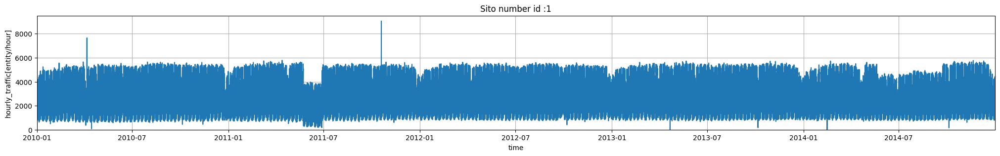

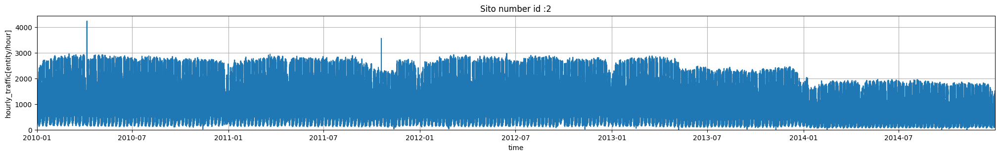

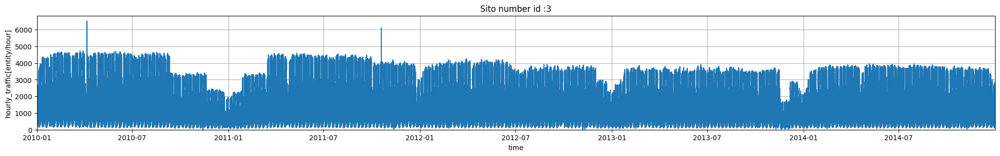

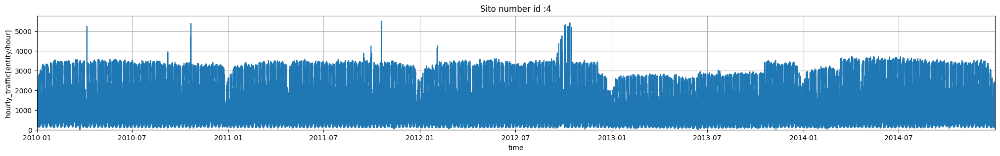

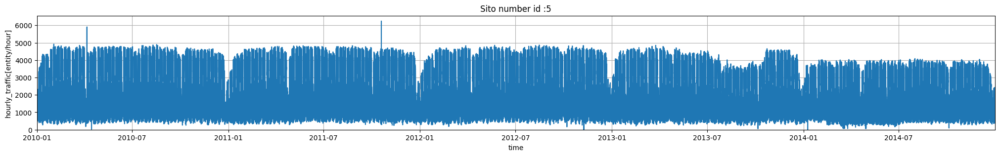

...

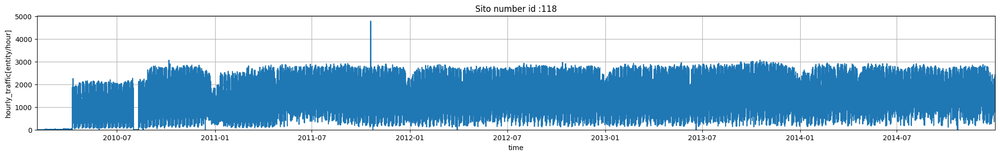

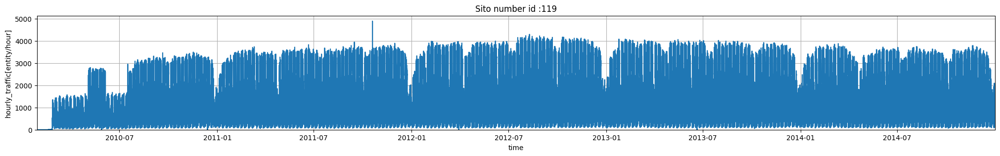

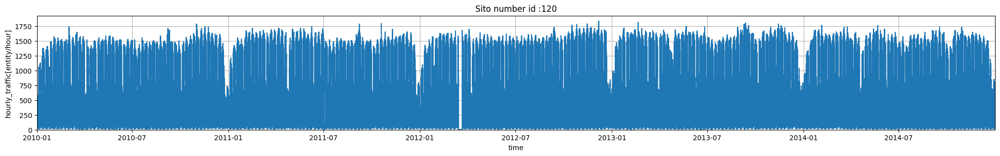

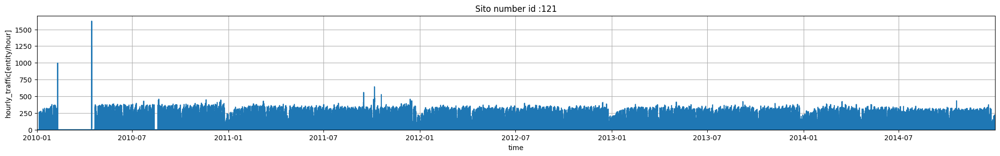

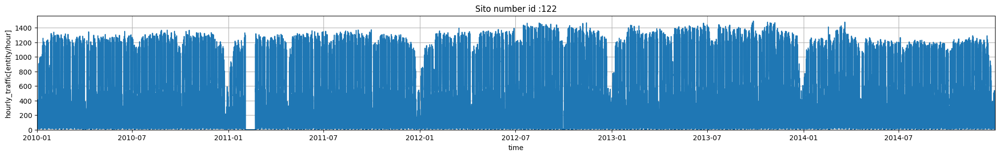

In [33]:
for i in range(max_site_no) :
    if not data_set.loc[(data_set.site_no == i)].empty :
        data = data_set.loc[data_set.site_no == i]
        plt.figure(figsize=(25,3))

        plt.title(f"Sito number id :{i}")
        plt.plot(data["date"],data["hourly_traffic"])
        
        plt.xlabel("time")
        plt.ylabel("hourly_traffic[entity/hour]")    
        plt.ylim(bottom = 0)

        plt.grid(visible=True)
        plt.margins(0)
        
        plt.savefig(f'img/Hourly_Traffic/site_{i}.svg')
        plt.show()
        

In [ ]:
#TODO: Drop
zero_value    = [6, 15, 33, 44, 49, 57, 62, 71, 79, 82, 86, 89, 102, 106, 109, 110, 111, 115, 118, 121, 122]
strange_value = [19, 51, 88, 117]

# Hourly_traffic == 0 for extended periods of time

In [ ]:
#TODO: Put the sites to be fixed into a vector